# SVM и его ядра

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [ ]:
import random
from typing import Callable

import matplotlib.pyplot as plt
import numpy
from cvxopt import matrix, solvers
from sklearn.datasets import make_blobs, make_moons

solvers.options["show_progress"] = False

In [5]:
SEED = 7
numpy.random.seed(SEED)
random.seed(SEED)

In [6]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200

    cm = plt.cm.Spectral

    xx, yy = numpy.meshgrid(
        numpy.arange(x_min - x_border, x_max + x_border, x_h), numpy.arange(y_min - y_border, y_max + y_border, y_h)
    )
    mesh = numpy.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading="gouraud")

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors="black")
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors="black", linestyles="dashed")

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(
        X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1.0, edgecolor="black", linewidth=0.8
    )
    plt.scatter(
        X[ind_incorrect, 0],
        X[ind_incorrect, 1],
        c=y[ind_incorrect],
        cmap=cm,
        alpha=1.0,
        marker="*",
        s=50,
        edgecolor="black",
        linewidth=0.8,
    )
    plt.scatter(
        X[ind_support, 0],
        X[ind_support, 1],
        c=y[ind_support],
        cmap=cm,
        alpha=1.0,
        edgecolor="yellow",
        linewidths=1.0,
        s=40,
    )

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [7]:
def generate_moons_dataset(n_points=1000, noise=0.075):
    X, y = make_moons(n_points, noise=noise, random_state=SEED)
    return X, 2 * y - 1

def generate_blobs_dataset(n_points=1000, n_features=2):
    X, y = make_blobs(n_points, n_features, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=SEED)
    y = 2 * (y % 2) - 1
    return X, y

X_moons, y_moons = generate_moons_dataset()
X_blobs, y_blobs = generate_blobs_dataset()

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM.

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P =
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C
    \end{array}
\right] \\
 G =
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1
    \end{array}
\right] $

In [14]:
class LinearSVM:
    def __init__(self, C: float):
        """SVM with linear kernel

        Args:
            C: Soft margin coefficient.
        """
        self.C = C
        self.support = None
        self._weights = None
        self._bias = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samles, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        n_samples, n_features = X.shape
        y = y.reshape(-1, 1)
        
        P = numpy.zeros((n_features + 1 + n_samples, n_features + 1 + n_samples))
        P[:n_features, :n_features] = numpy.eye(n_features)

        q = numpy.zeros(n_features + 1 + n_samples)
        q[n_features + 1:] = self.C

        G_xi = numpy.hstack([
            numpy.zeros((n_samples, n_features + 1)), 
            -numpy.eye(n_samples)])
        
        G_class = numpy.hstack([-y * X, -y, -numpy.eye(n_samples)])
        G = numpy.vstack([G_xi, G_class])
        h = numpy.hstack([numpy.zeros(n_samples), -numpy.ones(n_samples)])

        P_cvx = matrix(P.astype(float))
        q_cvx = matrix(q.astype(float))
        G_cvx = matrix(G.astype(float))
        h_cvx = matrix(h.astype(float))

        solution = solvers.qp(P_cvx, q_cvx, G_cvx, h_cvx)
        x_optimal = numpy.array(solution['x']).flatten()

        self._weights = x_optimal[:n_features]
        self._bias = x_optimal[n_features]
        xi = x_optimal[n_features + 1:]

        self.support = numpy.where(xi > 1e-5)[0]

    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Decision for each input point, [n_samples, ]
        """
        return X @ self._weights + self._bias


    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """Classify input points

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """
        return numpy.sign(self.decision_function(X))


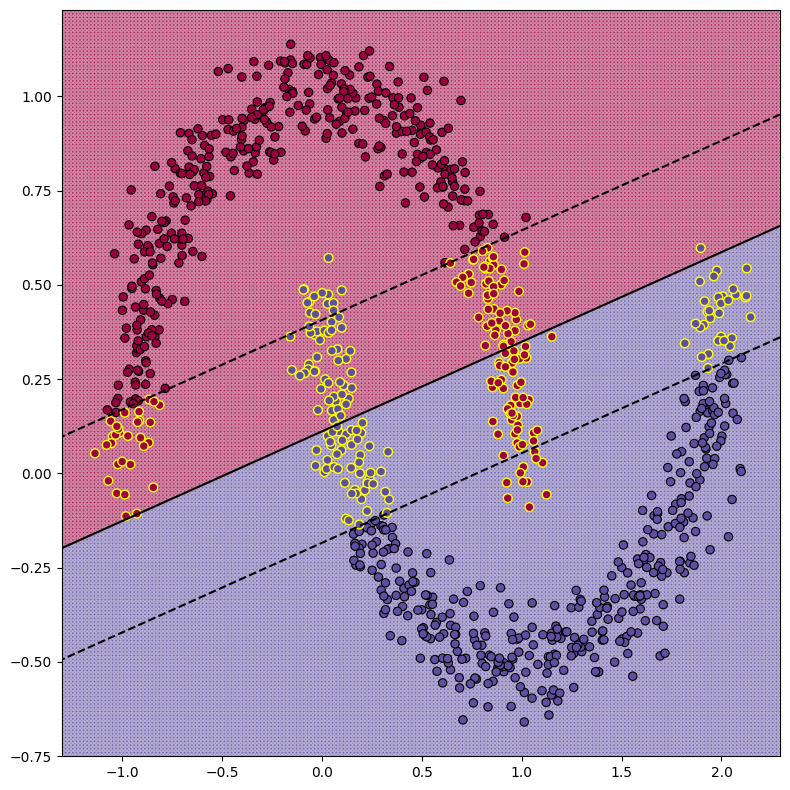

In [15]:
svm = LinearSVM(1)
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

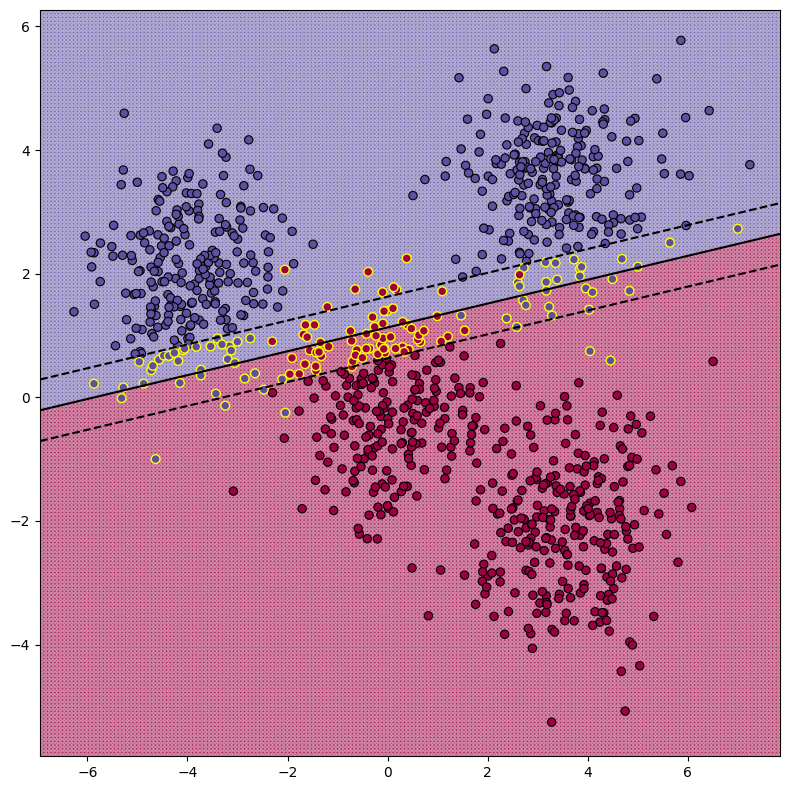

In [16]:
svm = LinearSVM(1)
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 2 (1 балл)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [ ]:
def linear_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
    return x1.dot(x2.T)


def get_polynomial_kernel(c=1, power=2):
    def polynomial_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        return (x1.dot(x2.T) + c) ** power

    return polynomial_kernel


def get_gaussian_kernel(sigma=1.0):

    def gaussian_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        x1_sq = numpy.sum(x1 ** 2, axis=1, keepdims=True)
        x2_sq = numpy.sum(x2 ** 2, axis=1, keepdims=True)
        pairwise_distanses = x1_sq - 2 * x1.dot(x2.T) + x2_sq.T

        return numpy.exp(-pairwise_distanses / (2 * sigma ** 2))

    return gaussian_kernel

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P =
\left[ y_i y_j K(y_i, y_j) \right] \\
q = \left[ -1
\right] \\
 G =
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [ ]:
class KernelSVM:

    _X = None
    _y = None
    w0 = None
    alphas = None

    def __init__(self, C: float, kernel: Callable = linear_kernel):
        """SVM with specified kernel

        Args:
            C: Soft margin coefficient
            kernel: Callable kernel for kernel trick
        """
        self.C = C
        self.kernel = kernel
        self.support = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samles, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        self._X = X
        self._y = y.reshape(-1, 1)
        n_samples, n_features = X.shape

        K = self.kernel(X,X)

        P = numpy.outer(y, y) * K
        P = matrix(P.astype(float))

        q = matrix(-numpy.ones(n_samples).astype(float))

        G = matrix(numpy.vstack((
            numpy.eye(n_samples),
            -numpy.eye(n_samples)
        )).astype(float))

        h = matrix(numpy.hstack((
            numpy.full(n_samples, self.C),
            numpy.zeros(n_samples)
        )).astype(float))

        A = matrix(y.reshape(1, -1).astype(float))
        b = matrix(numpy.zeros(1).astype(float))

        solution = solvers.qp(P, q, G, h, A, b)
        self.alphas = numpy.array(solution['x']).flatten()

        self.support = numpy.where(self.alphas > 1e-5)[0]

        sv_indices = self.support
        y_sv = y[sv_indices]
        K_sv = self.kernel(X[sv_indices], X)
        self.w0 = numpy.mean(
            y_sv - numpy.dot((self.alphas * y).T, K_sv.T)
        )


    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Decision for each input point, [n_samples, ]
        """
        K_test = self.kernel(X, self._X)
        return numpy.dot(K_test, self.alphas * self._y.flatten()) + self.w0


    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """Classify input points

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """
        return numpy.sign(self.decision_function(X))

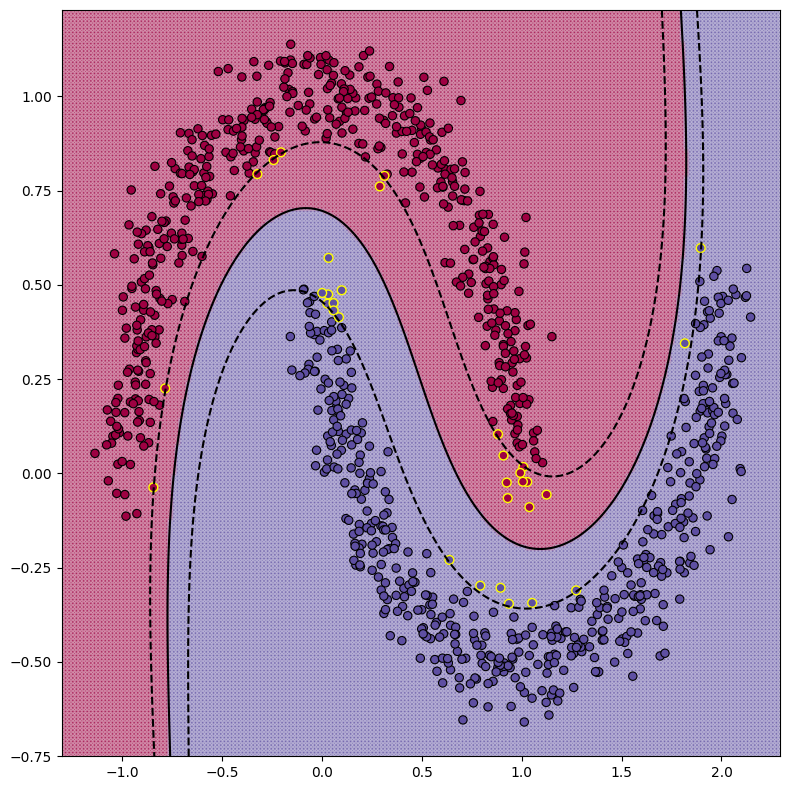

In [22]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

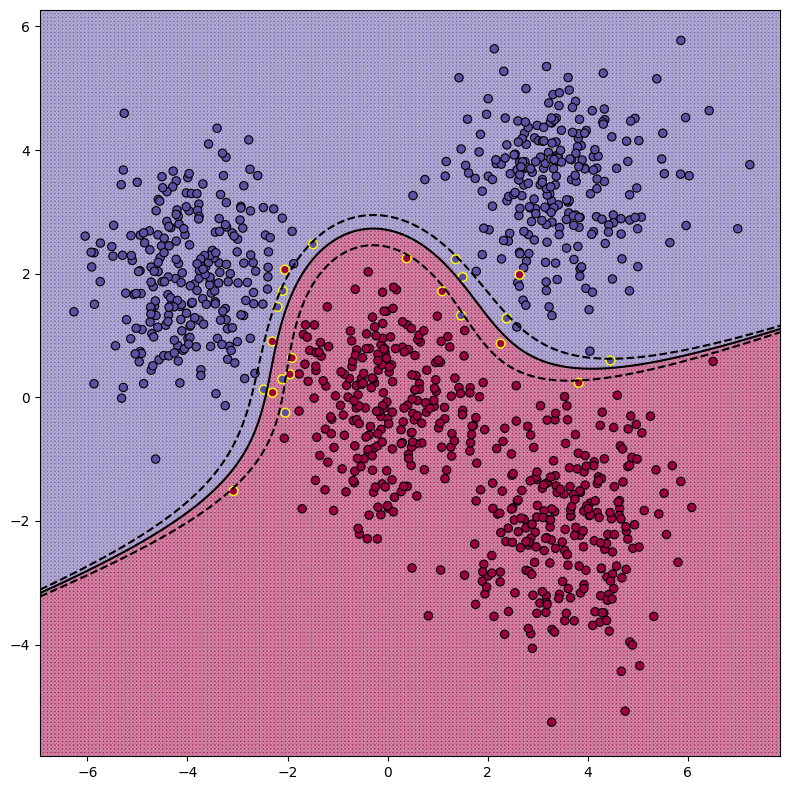

In [23]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

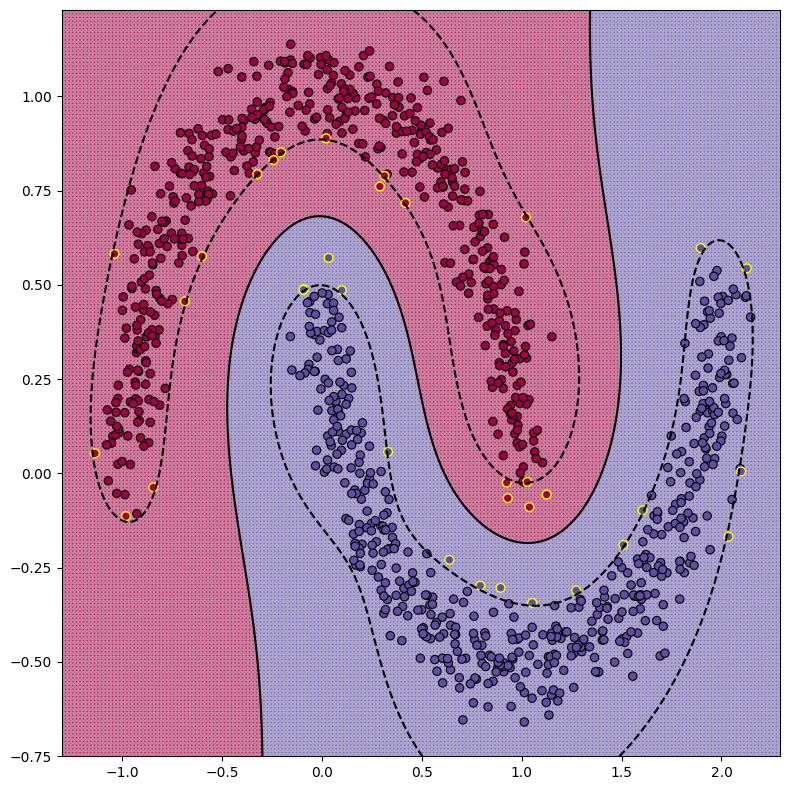

In [24]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

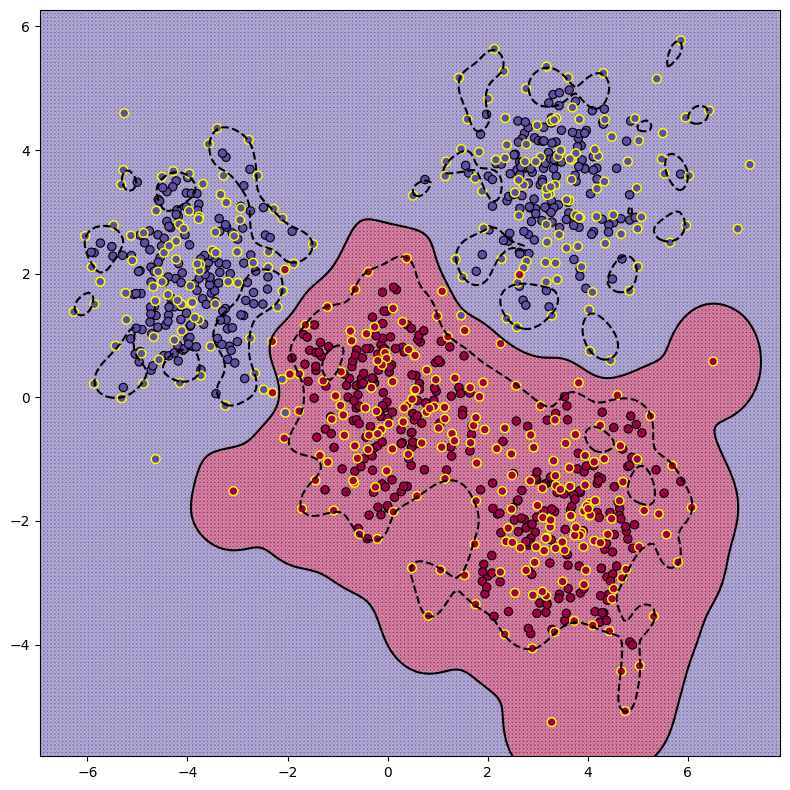

In [25]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 4 (2 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

In [39]:
def visualize_kernel_influence(dataset, kernel_type, params, C=1.0):
    X, y = dataset
    plt.figure(figsize=(12, 10))
    
    for i, param in enumerate(params, 1):
        plt.subplot(2, 2, i)
        
        if kernel_type == 'poly':
            kernel = get_polynomial_kernel(c=param[0], power=param[1])
        elif kernel_type == 'rbf':
            kernel = get_gaussian_kernel(sigma=param)
            
        svm = KernelSVM(C=C, kernel=kernel)
        svm.fit(X, y)
        visualize(svm, X, y)
        
        title = f'{kernel_type.upper()} kernel: '
        title += f'c={param[0]}, power={param[1]}' if kernel_type == 'poly' else f'σ={param}'
        plt.title(title)

    plt.tight_layout()
    plt.show()

### Polynomial kernel

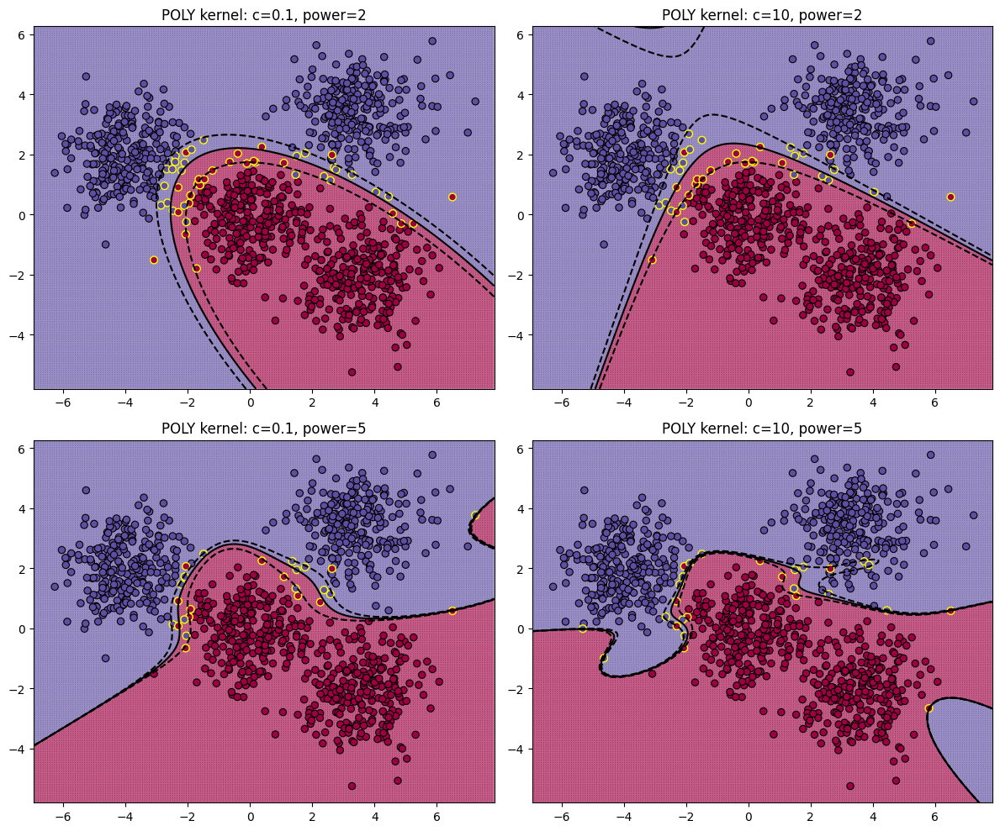

In [ ]:
poly_params = [
    (0.1, 2),
    (10, 2),
    (0.1, 5),
    (10, 5)
]

visualize_kernel_influence((X_blobs, y_blobs), 'poly', poly_params)

**Вывод**: При увеличении степени планые линии становятся более извилистыми, что может привести к переобучению, а при увеличении константы граница становится более гибкой, но при слишком больших значениях начинает захватывать шумы

### RBF kernel


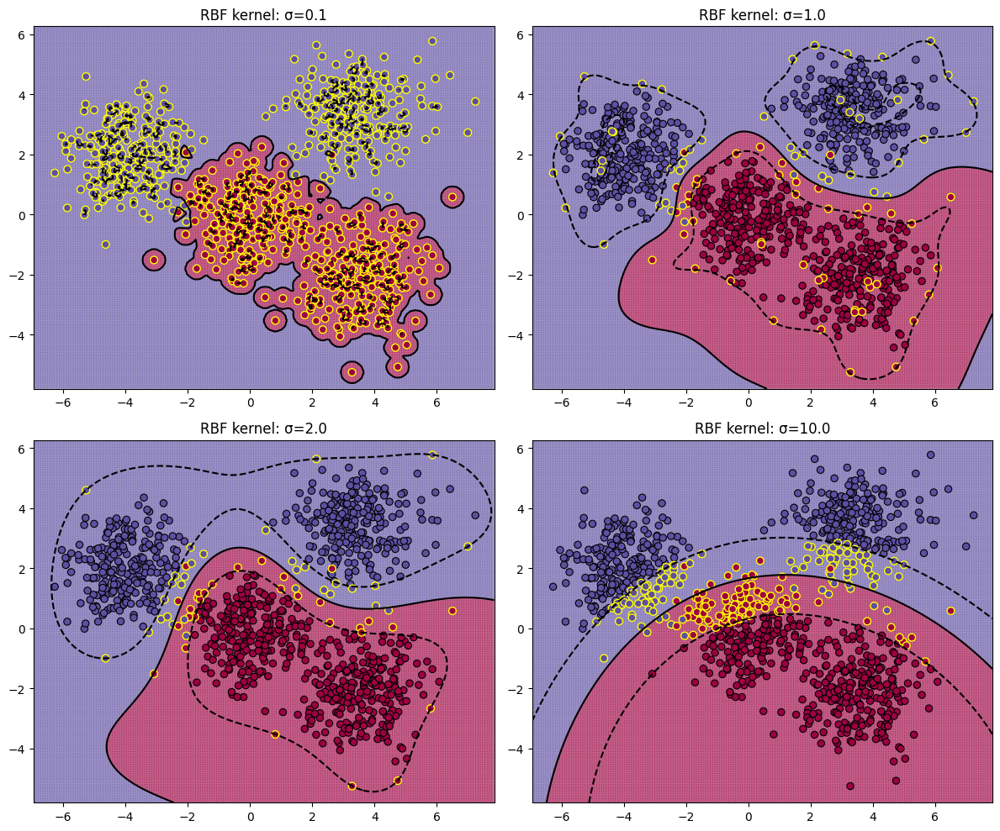

In [42]:
rbf_params = [0.1, 1.0, 2.0, 10.0]
visualize_kernel_influence((X_blobs, y_blobs), 'rbf', rbf_params)

**Вывод**: При слишком маленькой сигме высокая чувствительность к шумам и решения очень локальны - переобучение, а при слишком большой локальность наоборот теряется и не может описать сложные формы

# Задание 5 (3 балла)

Поставьте эксперимент и сравните SVM с логистической регрессией на синтетических данных. Для этого для каждого датасета:

1. Воспользуйтесь реализацией логистической регрессии из `sklearn`
2. Подготовьте данные, преобразуйте их для лучшей разделимости, например, добавьте polynomial features
3. Зафиксируйте метрику
4. Подберите гиперпараметры обоих моделей
5. Напишите вывод, какая из моделей обучилась лучше и почему так вышло

In [85]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

In [86]:
X_moons, y_moons = generate_moons_dataset()
X_blobs, y_blobs = generate_blobs_dataset()

def split_data(X, y):
    return train_test_split(X, y, test_size=0.2, random_state=42)

X_moons_train, X_moons_test, y_moons_train, y_moons_test = split_data(X_moons, y_moons)
X_blobs_train, X_blobs_test, y_blobs_train, y_blobs_test = split_data(X_blobs, y_blobs)

In [87]:
lr_pipeline = Pipeline([
    ('poly', PolynomialFeatures()),
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(max_iter=1000))
])

lr_param_grid = {
    'poly__degree': [1, 2, 3],
    'lr__C': [0.1, 1, 10]
}

lr_moons_grid = GridSearchCV(lr_pipeline, lr_param_grid, cv=5, scoring='accuracy')
lr_moons_grid.fit(X_moons_train, y_moons_train)
print(f"Лучшие параметры: {lr_moons_grid.best_params_}, accuracy: {lr_moons_grid.best_score_:.3f}")

lr_blobs_grid = GridSearchCV(lr_pipeline, lr_param_grid, cv=5, scoring='accuracy')
lr_blobs_grid.fit(X_blobs_train, y_blobs_train)
print(f"Лучшие параметры: {lr_blobs_grid.best_params_}, accuracy: {lr_blobs_grid.best_score_:.3f}")

Лучшие параметры: {'lr__C': 10, 'poly__degree': 3}, accuracy: 1.000
Лучшие параметры: {'lr__C': 10, 'poly__degree': 3}, accuracy: 0.986


In [88]:
def tune_svm(X_train, y_train, kernel_type):
    best_score = 0
    best_params = {}
    
    if kernel_type == 'poly':
        for C in [0.1, 1, 5, 10]:
            for power in [2, 3, 4, 5]:
                for const in [0.1, 1, 5, 10]:
                    svm = KernelSVM(C=C, kernel=get_polynomial_kernel(c=const, power=power))
                    svm.fit(X_train, y_train)
                    y_pred = svm.predict(X_train)
                    score = accuracy_score(y_train, y_pred)
                    if score > best_score:
                        best_score = score
                        best_params = {'C': C, 'power': power, 'c': const}
    
    elif kernel_type == 'rbf':
        for C in [0.1, 1, 5, 10]:
            for sigma in [0.1, 0.5, 1, 5]:
                svm = KernelSVM(C=C, kernel=get_gaussian_kernel(sigma=sigma))
                svm.fit(X_train, y_train)
                y_pred = svm.predict(X_train)
                score = accuracy_score(y_train, y_pred)
                if score > best_score:
                    best_score = score
                    best_params = {'C': C, 'sigma': sigma}
    
    print(f"Лучшие параметры {kernel_type}: {best_params}, accuracy: {best_score:.3f}")
    return best_params

svm_moons_params = tune_svm(X_moons_train, y_moons_train, 'rbf')

svm_blobs_params = tune_svm(X_blobs_train, y_blobs_train, 'poly')

Лучшие параметры rbf: {'C': 0.1, 'sigma': 0.1}, accuracy: 1.000
Лучшие параметры poly: {'C': 1, 'power': 5, 'c': 10}, accuracy: 0.998


In [91]:
lr_moons_best = lr_moons_grid.best_estimator_
svm_moons_best = KernelSVM(C=svm_moons_params['C'], kernel=get_gaussian_kernel(sigma=svm_moons_params['sigma']))

lr_blobs_best = lr_blobs_grid.best_estimator_
svm_blobs_best = KernelSVM(C=svm_blobs_params['C'], 
                     kernel=get_polynomial_kernel(c=svm_blobs_params['c'], power=svm_blobs_params['power']))

svm_moons_best.fit(X_moons_train, y_moons_train)
svm_blobs_best.fit(X_blobs_train, y_blobs_train)

results = {
    'moons': {
        'LR': accuracy_score(y_moons_test, lr_moons_best.predict(X_moons_test)),
        'SVM': accuracy_score(y_moons_test, svm_moons_best.predict(X_moons_test))
    },
    'blobs': {
        'LR': accuracy_score(y_blobs_test, lr_blobs_best.predict(X_blobs_test)),
        'SVM': accuracy_score(y_blobs_test, svm_blobs_best.predict(X_blobs_test))
    }
}

print("\nИтоговые результаты:")
print(f"Moons (RBF): SVM - {results['moons']['SVM']:.3f}, LR - {results['moons']['LR']:.3f}")
print(f"Blobs (Poly): SVM - {results['blobs']['SVM']:.3f}, LR - {results['blobs']['LR']:.3f}")


Итоговые результаты:
Moons (RBF): SVM - 1.000, LR - 1.000
Blobs (Poly): SVM - 0.985, LR - 1.000


Вывод: Обе модели справились хорошо, возможно из-за исскуственно созданных данных, благодаря чему они смогли уловить зависимости